In [1]:
import healpy as hp

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

print('all packages are successfully loaded')

import sys
print('python version: ' + sys.version)

import platform
print('Current OS: ' + platform.platform())

all packages are successfully loaded
python version: 3.6.8 (default, Oct  7 2019, 12:59:55) 
[GCC 8.3.0]
Current OS: Linux-4.4.0-18362-Microsoft-x86_64-with-Ubuntu-18.04-bionic


# Functions

In [2]:
def load_map(path, NSIDE = 1024, mask = None):
    """Loads map from *.fits file and applies mask if necessary
    
        Args: 
          path: path to file.
          NSIDE: fixed HEALPix map parameter.
          mask: mask to apply.

        Returns: 
          map as NumPy array    
    """
    m = hp.read_map(path)
    if mask is None:
        mask = np.zeros(hp.nside2npix(NSIDE), dtype=np.double)
        pixel_theta, pixel_phi = hp.pix2ang(NSIDE, np.arange(hp.nside2npix(NSIDE))) #pixel coords
        mask[np.logical_or(pixel_theta < (np.pi/2 - np.pi/60), (np.pi/2 + np.pi/60) < pixel_theta)] = 1
        
    m = m * mask
    
    hp.mollview(m, unit='mK', norm='hist')
    plt.show()
    return m

In [3]:
def get_ilc_weights(m_list):
    """Calculates ILC weights
    
        Args: 
          m_list: list of maps.

        Returns: 
          NumPy array of weights  
    """
    y = np.vstack(m_list)
    C = np.cov(y)
    C_inv = np.linalg.inv(C)
    w = np.sum(C_inv, axis=1) / np.sum(C_inv)
    return w

In [4]:
def get_final_map(m_list, w):
    """Calculates estimator
     
        Args: 
          m_list: list of maps.
          w: array of weights

        Returns: 
          final map as NumPy array  
    """
    m = sum(a * b for a, b in zip(w, m_list))
    return m

# Load $\mbox{NSIDE} = 1024$ data

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


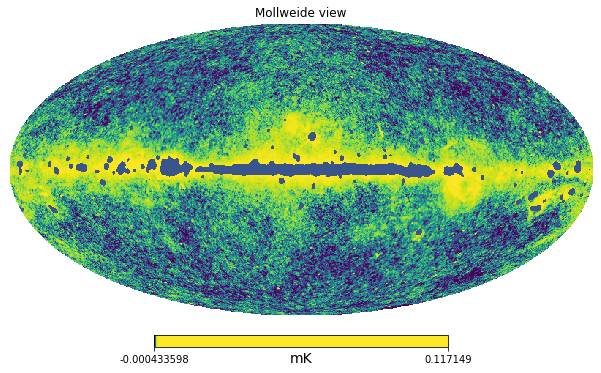

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


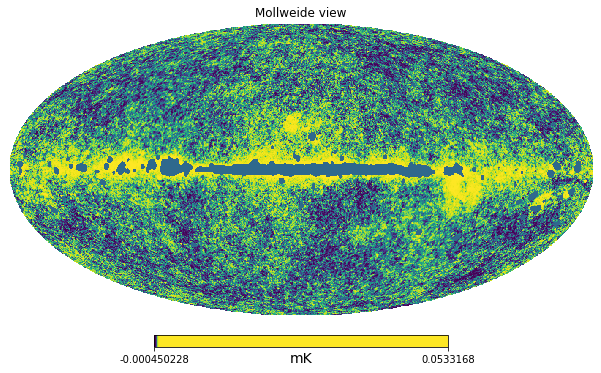

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


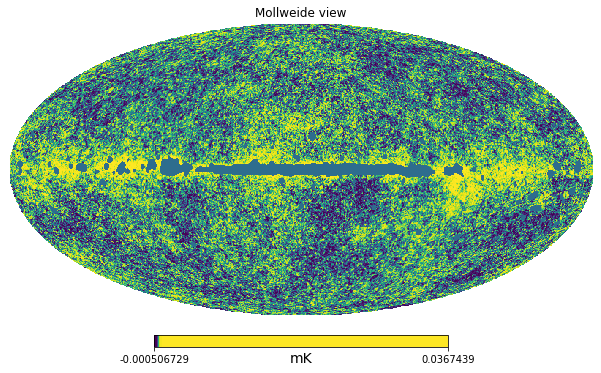

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


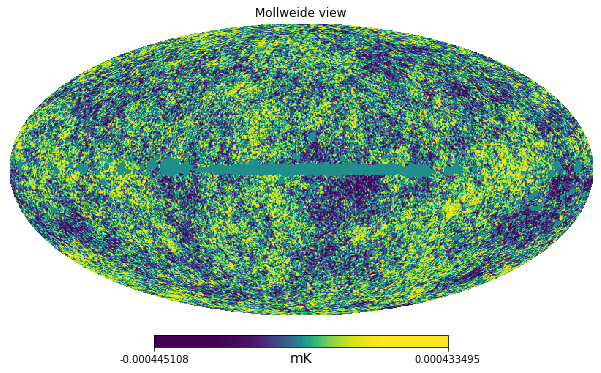

In [5]:
mask = hp.read_map('COM_CMB_IQU-nilc_1024_R2.02_full.fits', field=3)

# maps with various freqs
m30 = load_map('LFI_SkyMap_030_1024_R2.01_full.fits', mask=mask)
m44 = load_map('LFI_SkyMap_044_1024_R2.01_full.fits', mask=mask)
m70 = load_map('LFI_SkyMap_070_1024_R2.01_full.fits', mask=mask)

# official CMB map
m_off = load_map('COM_CMB_IQU-nilc_1024_R2.02_full.fits', mask=mask)

m_1024 = [m30, m44, m70]

# Calculation of ILC estimator for $\mbox{NSIDE} = 1024$

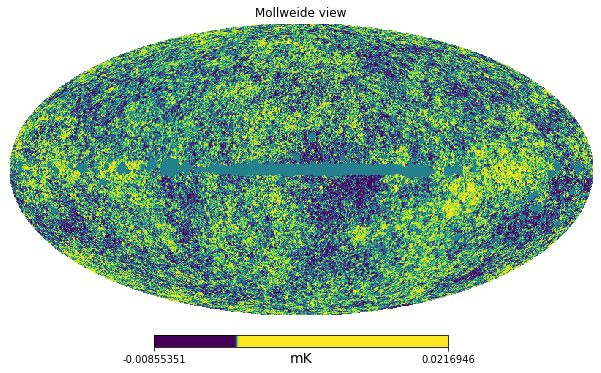

In [6]:
w_1024 = get_ilc_weights(m_1024)
m_f = get_final_map(m_1024, w_1024) #estimator map

hp.mollview(m_f, unit='mK', norm='hist')
plt.show()

# Compare estimated map with official

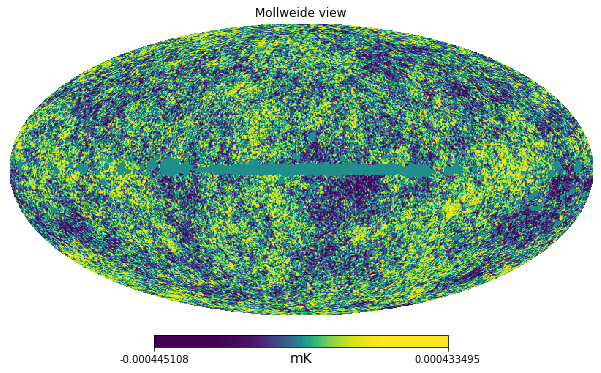

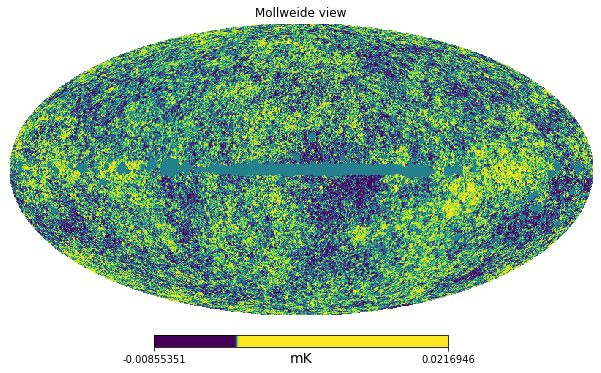

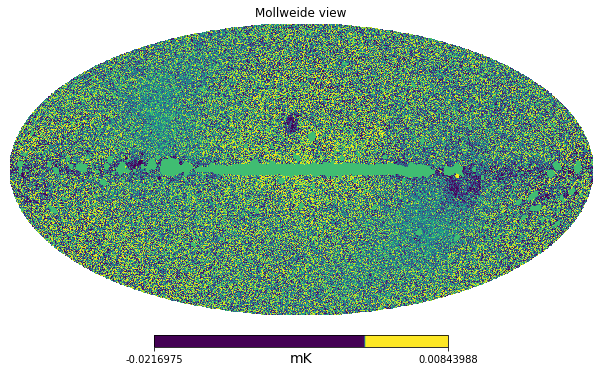

In [7]:
# official
hp.mollview(m_off, unit='mK', norm='hist')
plt.show()

# estimated map
hp.mollview(m_f, unit='mK', norm='hist')
plt.show()

# difference
hp.mollview(m_off - m_f, unit='mK', norm='hist')
plt.show()

# Load $\mbox{NSIDE} = 2048$ data

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


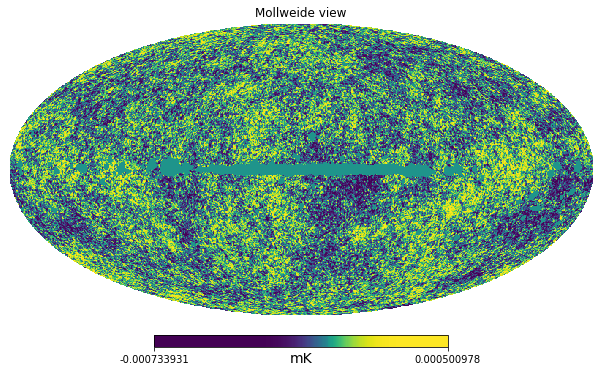

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


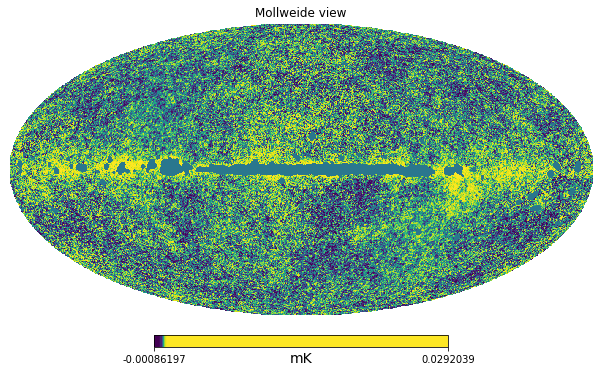

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


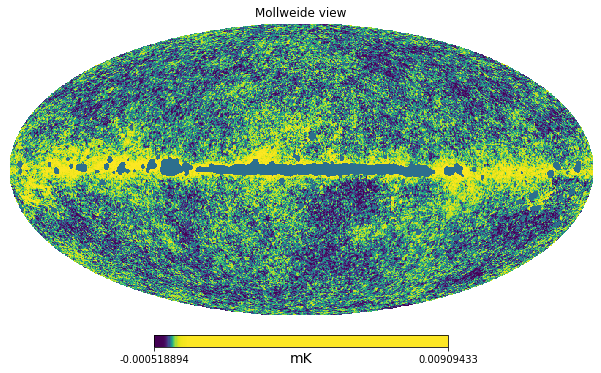

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


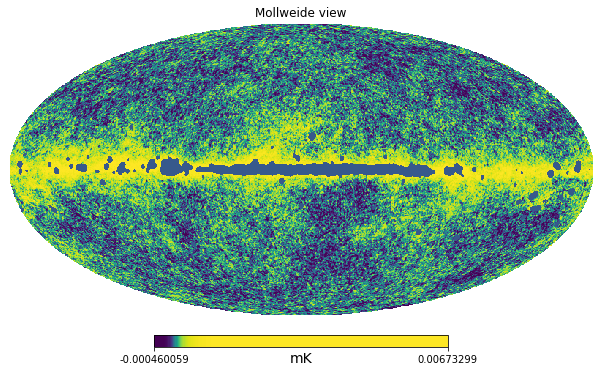

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


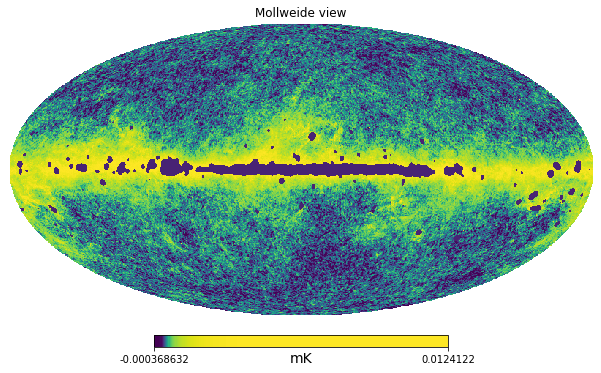

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


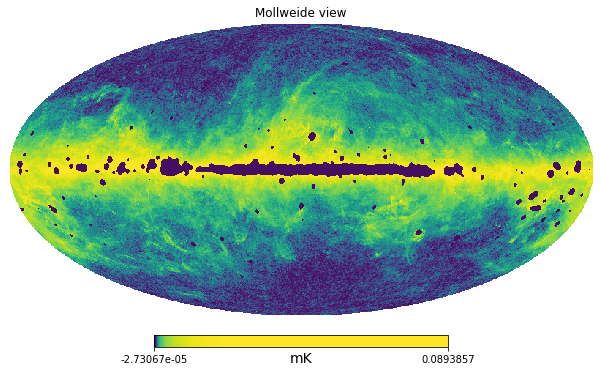

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


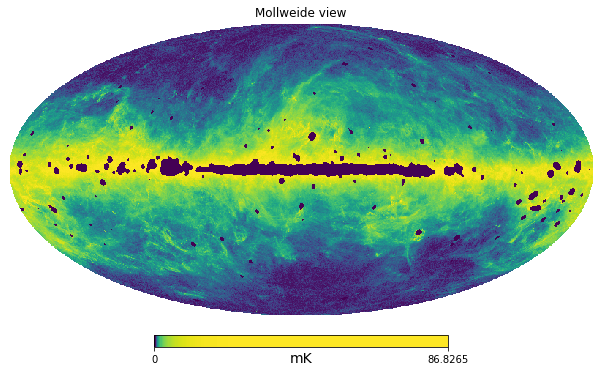

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


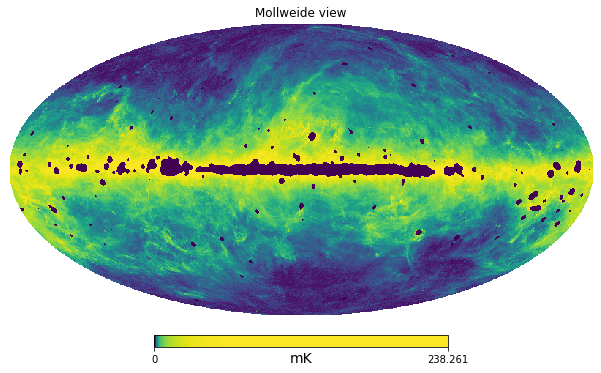

In [8]:
mask_2048 = hp.read_map('COM_CMB_IQU-nilc-field-Int_2048_R2.01_full.fits', field=1)
m_off_2048 = load_map('COM_CMB_IQU-nilc-field-Int_2048_R2.01_full.fits', 2048, mask=mask_2048)

m70 = load_map('LFI_SkyMap_070_2048_R2.01_full.fits', 2048, mask=mask_2048)
m100 = load_map('HFI_SkyMap_100_2048_R2.02_full.fits', 2048, mask=mask_2048)
m143 = load_map('HFI_SkyMap_143_2048_R2.02_full.fits', 2048, mask=mask_2048)
m217 = load_map('HFI_SkyMap_217_2048_R2.02_full.fits', 2048, mask=mask_2048)
m353 = load_map('HFI_SkyMap_353_2048_R2.02_full.fits', 2048, mask=mask_2048)
m545 = load_map('HFI_SkyMap_545_2048_R2.02_full.fits', 2048, mask=mask_2048)
m857 = load_map('HFI_SkyMap_857_2048_R2.02_full.fits', 2048, mask=mask_2048)

m_2048 = [m70, m100, m143, m217, m353, m545, m857]

# Calculation of ILC estimator for $\mbox{NSIDE} = 2048$

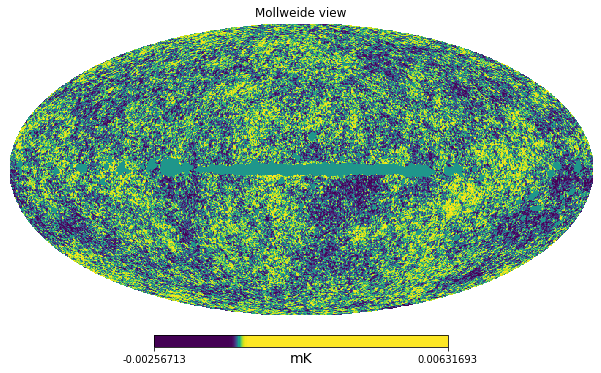

In [9]:
w_2048 = get_ilc_weights(m_2048)
m_f_2048 = get_final_map(m_2048, w_2048)

hp.mollview(m_f_2048, unit='mK', norm='hist')
plt.show()

# Compare estimated map with official

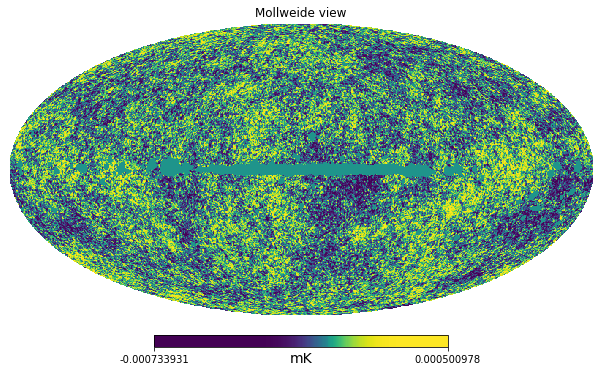

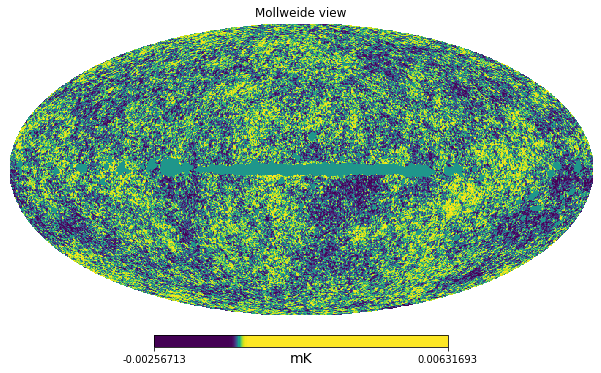

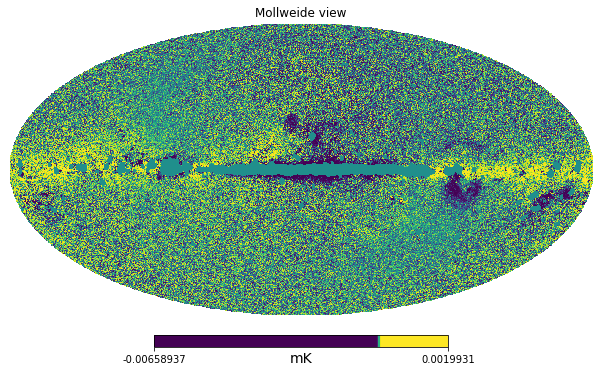

In [10]:
# official
hp.mollview(m_off_2048, unit='mK', norm='hist')
plt.show()

# estimated map
hp.mollview(m_f_2048, unit='mK', norm='hist')
plt.show()

# difference
hp.mollview(m_off_2048 - m_f_2048, unit='mK', norm='hist')
plt.show()